In [ ]:
from __future__ import division
import os
import time
import numpy as np
import pandas as pd
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

from IPython.display import clear_output

try:
  # %tensorflow_version only exists in Colab.
  %tensorflow_version 2.x
except Exception:
  pass
import tensorflow as tf
from tensorflow.keras.layers import Layer, Conv2D, Conv2DTranspose, Activation, Reshape, LayerNormalization, BatchNormalization
from tensorflow.keras.layers import Input, Dropout, Concatenate, Dense, LeakyReLU, Flatten
from tensorflow.keras import Model
from tensorflow.keras import backend as K
from tensorflow.keras.optimizers import Adam, SGD
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.utils import plot_model
# Run in colab
import tensorflow_datasets as tfds

AUTOTUNE = tf.data.experimental.AUTOTUNE

Colab only includes TensorFlow 2.x; %tensorflow_version has no effect.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# load data

In [ ]:
import os
os.environ['KAGGLE_CONFIG_DIR'] = "/content/sample_data"
# file_path is the path where kaggle.json is present in the Google Drive

In [ ]:
%cd /content/sample_data

/content/sample_data


In [ ]:
!kaggle datasets download -d jessicali9530/celeba-dataset


100% 1.33G/1.33G [01:04<00:00, 25.5MB/s]
100% 1.33G/1.33G [01:04<00:00, 22.0MB/s]


In [ ]:

#unzipping the zip files and deleting the zip files
!unzip \*.zip  && rm *.zip

Archive:  celeba-dataset.zip
replace img_align_celeba/img_align_celeba/000001.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace img_align_celeba/img_align_celeba/000002.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: n a
replace img_align_celeba/img_align_celeba/000003.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
MODEL_NAME = 'DCGAN'
DATA_BASE_DIR = 'dataset/images/'
TRAIN_LOGDIR = os.path.join("/content/drive/MyDrive/wgan_trainrecord2/logs", "tensorflow", MODEL_NAME, 'train_data') # Sets up a log directory.
OUTPUT_PATH = os.path.join('/content/drive/MyDrive/wgan_trainrecord2', MODEL_NAME)
print(OUTPUT_PATH)

if not os.path.exists(OUTPUT_PATH):
    os.makedirs(OUTPUT_PATH)
    
TARGET_IMG_SIZE = 64 # Scale images to this size

BATCH_SIZE = 128
NOISE_DIM = 100
LAMBDA = 10 # For gradient penalty

EPOCHs = 40
CURRENT_EPOCH = 1 # Epoch start from
SAVE_EVERY_N_EPOCH = 15 # Save checkpoint at every n epoch

N_CRITIC = 3 # Train critic(discriminator) n times then train generator 1 time.
LR = 1e-4
MIN_LR = 0.000001 # Minimum value of learning rate
DECAY_FACTOR=1.00004 # learning rate decay factor

# Creates a file writer for the log directory.
file_writer = tf.summary.create_file_writer(TRAIN_LOGDIR)

/content/drive/MyDrive/wgan_trainrecord2/DCGAN


In [ ]:
# Modify the directory to the path of your dataset
list_ds = tf.data.Dataset.list_files('/content/sample_data/img_align_celeba/img_align_celeba/*')

for f in list_ds.take(5):
    print(f.numpy())


# Use tensorflow dataset in colab is more convenient
# list_ds = tfds.load (name="celeb_a", split="train", data_dir = '/content/sample_data/img_align_celeba/'
# ,shuffle_files=True, download = False) 



b'/content/sample_data/img_align_celeba/img_align_celeba/171363.jpg'
b'/content/sample_data/img_align_celeba/img_align_celeba/183725.jpg'
b'/content/sample_data/img_align_celeba/img_align_celeba/028225.jpg'
b'/content/sample_data/img_align_celeba/img_align_celeba/049319.jpg'
b'/content/sample_data/img_align_celeba/img_align_celeba/031099.jpg'


In [ ]:
def normalize(image):
    '''
        normalizing the images to [-1, 1]
    '''
    image = tf.cast(image, tf.float32)
    image = (image - 127.5) / 127.5
    return image
# file_path = '/content/sample_data/img_align_celeba/img_align_celeba/'

def preprocess_image(file_path):
    images = tf.io.read_file(file_path)
    # convert the compressed string to a 3D uint8 tensor
    images = tf.image.decode_jpeg(images, channels=3)
    images = tf.image.resize(images, (TARGET_IMG_SIZE, TARGET_IMG_SIZE),
                           method='bicubic', antialias=True)
    images = normalize(images)
    return images


In [ ]:

train_data = list_ds.map(preprocess_image).shuffle(1000).batch(BATCH_SIZE)

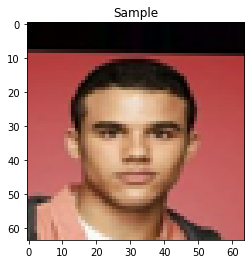

In [ ]:
sample_img = next(iter(train_data))
plt.title('Sample')
plt.imshow(np.clip(sample_img[0] * 0.5 + 0.5, 0, 1))

# build model

In [ ]:
def CGAN_generator(input_z_shape=NOISE_DIM):
    '''
        DCGAN model architecture
    '''
    input_z_layer = Input(input_z_shape)
    
    z = Dense(4*4*512, use_bias=False)(input_z_layer)
    z =Reshape((4, 4, 512))(z)
    
    x = Conv2DTranspose(512, (4, 4), strides=(1, 1), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(z)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    
    x = Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    
    x = Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    
    x = Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    x = BatchNormalization()(x)
    x = LeakyReLU()(x)
    
    output = Conv2DTranspose(3, (4, 4), strides=(2, 2), padding='same', use_bias=False, activation="tanh",
                             kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    
    model = Model(inputs=input_z_layer, outputs=output)
    return model

def CGAN_discriminator(input_x_shape=(TARGET_IMG_SIZE, TARGET_IMG_SIZE, 3)):
    input_x_layer = Input(input_x_shape)
    
    x = Conv2D(64, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(input_x_layer)
    #x = LayerNormalization()(x)
    x = LeakyReLU()(x)
    
    x = Conv2D(128, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    #x = LayerNormalization()(x)
    x = LeakyReLU()(x)
    
    x = Conv2D(256, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    #x = LayerNormalization()(x)
    x = LeakyReLU()(x)
    
    x = Conv2D(512, (4, 4), strides=(2, 2), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    #x = LayerNormalization()(x)
    x = LeakyReLU()(x)
    
    x = Conv2D(1, (4, 4), strides=(1, 1), padding='same', use_bias=False, kernel_initializer=RandomNormal(mean=0.0, stddev=0.02))(x)
    
    x = Flatten()(x)
    
    output = Dense(1)(x)
    
    model = Model(inputs=input_x_layer, outputs=output)
    return model

In [ ]:
generator = CGAN_generator()


In [ ]:
generator.summary()
# Require extra packages to plot model 
# plot_model(generator, show_shapes=True, dpi=64)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100)]             0         
                                                                 
 dense (Dense)               (None, 8192)              819200    
                                                                 
 reshape (Reshape)           (None, 4, 4, 512)         0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 4, 4, 512)        4194304   
 nspose)                                                         
                                                                 
 batch_normalization (BatchN  (None, 4, 4, 512)        2048      
 ormalization)                                                   
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 4, 4, 512)         0     

In [ ]:
discriminator = CGAN_discriminator()

In [ ]:
discriminator.summary()
# Require extra packages to plot model 
# plot_model(discriminator, show_shapes=True, dpi=64)

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 64, 64, 3)]       0         
                                                                 
 conv2d (Conv2D)             (None, 32, 32, 64)        3072      
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 32, 32, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       131072    
                                                                 
 leaky_re_lu_5 (LeakyReLU)   (None, 16, 16, 128)       0         
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 256)         524288    
                                                                 
 leaky_re_lu_6 (LeakyReLU)   (None, 8, 8, 256)         0   

In [ ]:
D_optimizer = Adam(learning_rate=LR, beta_1=0.5)
G_optimizer = Adam(learning_rate=LR, beta_1=0.5)

def learning_rate_decay(current_lr, decay_factor=DECAY_FACTOR):
    new_lr = max(current_lr / decay_factor, MIN_LR)
    return new_lr

def set_learning_rate(new_lr):
    '''
        Set new learning rate to optimizers
    '''
    
    K.set_value(D_optimizer.lr, new_lr)
    K.set_value(G_optimizer.lr, new_lr)

In [ ]:
checkpoint_path = os.path.join("/content/drive/MyDrive/wgan_trainrecord2/checkpoints", "tensorflow", MODEL_NAME)

ckpt = tf.train.Checkpoint(generator=generator,
                           discriminator=discriminator,
                           G_optimizer=G_optimizer,
                           D_optimizer=D_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
    ckpt.restore(ckpt_manager.latest_checkpoint)
    latest_epoch = int(ckpt_manager.latest_checkpoint.split('-')[1])
    CURRENT_EPOCH = latest_epoch * SAVE_EVERY_N_EPOCH
    print ('Latest checkpoint of epoch {} restored!!'.format(CURRENT_EPOCH))

In [ ]:
def generate_and_save_images(model, epoch, test_input, figure_size=(12,6), subplot=(3,6), save=True, is_flatten=False):
    # Test input is a list include noise and label
    predictions = model.predict(test_input)
    if is_flatten:
        predictions = predictions.reshape(-1, IMG_WIDTH, IMG_HEIGHT, 3).astype('float32')
    fig = plt.figure(figsize=figure_size)
    for i in range(predictions.shape[0]):
        axs = plt.subplot(subplot[0], subplot[1], i+1)
        plt.imshow(predictions[i] * 0.5 + 0.5)
        plt.axis('off')
    if save:
        plt.savefig(os.path.join(OUTPUT_PATH, 'image_at_epoch_{:04d}.png'.format(epoch)))
    plt.show()

1/1 [==============================] - 9s 9s/step


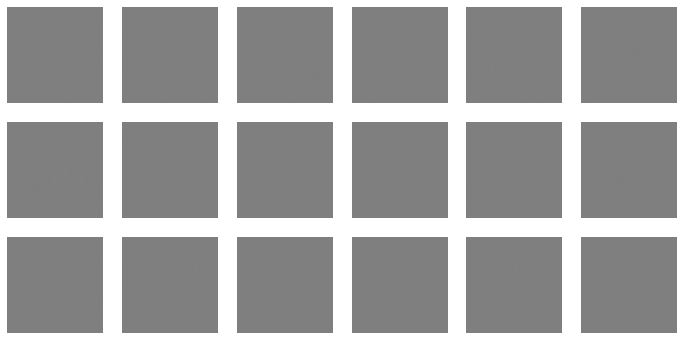

In [ ]:
num_examples_to_generate = 18

# We will reuse this seed overtime (so it's easier)
# to visualize progress in the animated GIF)
sample_noise = tf.random.normal([num_examples_to_generate, NOISE_DIM])
generate_and_save_images(generator, 0, [sample_noise], figure_size=(12,6), subplot=(3,6), save=False, is_flatten=False)

In [ ]:
@tf.function
def WGAN_GP_train_d_step(real_image, batch_size, step):
    '''
        One training step
        
        Reference: https://www.tensorflow.org/tutorials/generative/dcgan
    '''
    # Print this to know when the graph is created
    print("retrace")
    noise = tf.random.normal([batch_size, NOISE_DIM])
    epsilon = tf.random.uniform(shape=[batch_size, 1, 1, 1], minval=0, maxval=1)
    ###################################
    # Train D
    ###################################
    with tf.GradientTape(persistent=True) as d_tape:
        with tf.GradientTape() as gp_tape:
            fake_image = generator([noise], training=True)
            fake_image_mixed = epsilon * tf.dtypes.cast(real_image, tf.float32) + ((1 - epsilon) * fake_image)
            fake_mixed_pred = discriminator([fake_image_mixed], training=True)
            
        # Compute gradient penalty
        grads = gp_tape.gradient(fake_mixed_pred, fake_image_mixed)
        grad_norms = tf.sqrt(tf.reduce_sum(tf.square(grads), axis=[1, 2, 3]))
        gradient_penalty = tf.reduce_mean(tf.square(grad_norms - 1))
        
        fake_pred = discriminator([fake_image], training=True)
        real_pred = discriminator([real_image], training=True)
        
        D_loss = tf.reduce_mean(fake_pred) - tf.reduce_mean(real_pred) + LAMBDA * gradient_penalty
    # Calculate the gradients for discriminator
    D_gradients = d_tape.gradient(D_loss,
                                            discriminator.trainable_variables)
    # Apply the gradients to the optimizer
    D_optimizer.apply_gradients(zip(D_gradients,
                                                discriminator.trainable_variables))
    # Write loss values to tensorboard
    if step % 10 == 0:
        with file_writer.as_default():
            tf.summary.scalar('D_loss', tf.reduce_mean(D_loss), step=step)

@tf.function
def WGAN_GP_train_g_step(real_image, batch_size, step):
    '''
        One training step
        
        Reference: https://www.tensorflow.org/tutorials/generative/dcgan
    '''
    # Print this to know when the graph is created
    print("retrace")
    noise = tf.random.normal([batch_size, NOISE_DIM])
    ###################################
    # Train G
    ###################################
    with tf.GradientTape() as g_tape:
        fake_image = generator([noise], training=True)
        fake_pred = discriminator([fake_image], training=True)
        G_loss = -tf.reduce_mean(fake_pred)
    # Calculate the gradients for generator
    G_gradients = g_tape.gradient(G_loss,
                                            generator.trainable_variables)
    # Apply the gradients to the optimizer
    G_optimizer.apply_gradients(zip(G_gradients,
                                                generator.trainable_variables))
    # Write loss values to tensorboard
    if step % 10 == 0:
        with file_writer.as_default():
            tf.summary.scalar('G_loss', G_loss, step=step)

# train

1/1 [==============================] - 0s 22ms/step


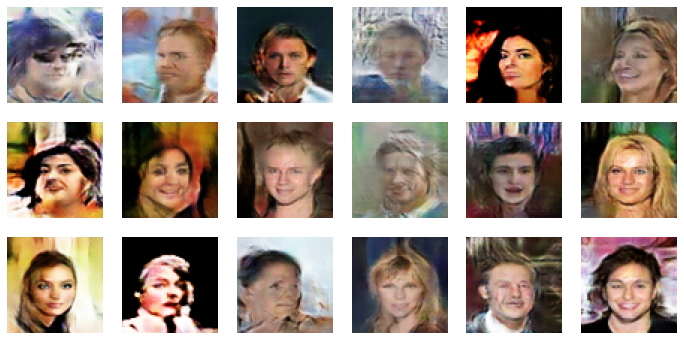

Time taken for epoch 40 is 81.69965052604675 sec



Saving checkpoint for epoch 40 at /content/drive/MyDrive/wgan_trainrecord1/checkpoints/tensorflow/DCGAN/ckpt-3


In [ ]:
current_learning_rate = LR
n_critic_count = 0

for epoch in range(CURRENT_EPOCH, EPOCHs + 1):
    start = time.time()
    print('Start of epoch %d' % (epoch,))
    # Using learning rate decay
    current_learning_rate = learning_rate_decay(current_learning_rate)
    print('current_learning_rate %f' % (current_learning_rate,))
    set_learning_rate(current_learning_rate)
    
    for step, (image) in enumerate(train_data):
        current_batch_size = image.shape[0]
        # Train critic (discriminator)
        WGAN_GP_train_d_step(image, batch_size=tf.constant(current_batch_size, dtype=tf.int64), step=tf.constant(step, dtype=tf.int64))
        n_critic_count += 1
        if n_critic_count >= N_CRITIC: 
            # Train generator
            WGAN_GP_train_g_step(image, batch_size= tf.constant(current_batch_size, dtype=tf.int64), step=tf.constant(step, dtype=tf.int64))
            n_critic_count = 0
        
        if step % 10 == 0:
            print ('.', end='')
    
    # Clear jupyter notebook cell output
    clear_output(wait=True)
    # Using a consistent sample so that the progress of the model is clearly visible.
    generate_and_save_images(generator, epoch, [sample_noise], figure_size=(12,6), subplot=(3,6), save=True, is_flatten=False)
    
    if epoch % SAVE_EVERY_N_EPOCH == 0:
        ckpt_save_path = ckpt_manager.save()
        print ('Saving checkpoint for epoch {} at {}'.format(epoch,
                                                             ckpt_save_path))
    
    print ('Time taken for epoch {} is {} sec\n'.format(epoch,
                                                      time.time()-start))
    
# Save at final epoch
ckpt_save_path = ckpt_manager.save()
generator.save(OUTPUT_PATH)
discriminator.save(OUTPUT_PATH)
print ('Saving checkpoint for epoch {} at {}'.format(EPOCHs,
                                                        ckpt_save_path))


# test

In [ ]:
test_noise = tf.random.normal([64, NOISE_DIM])
prediction = generator.predict(test_noise)

2/2 [==============================] - 0s 5ms/step


In [ ]:
def image_grid(images, fig):
    """Return a 5x5 grid of the MNIST images as a matplotlib figure."""
    # Create a figure to contain the plot.
    for i in range(64):
        # Start next subplot.
        axs = fig.add_subplot(8, 8, i + 1)
        axs.set_xticks([])
        axs.set_yticks([])
        axs.imshow(np.clip(images[i] * 0.5 + 0.5, 0, 1))

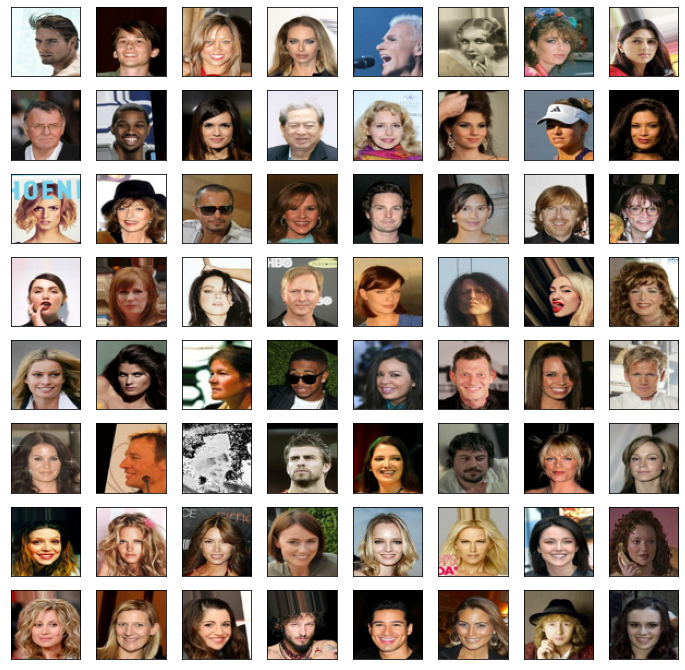

In [ ]:
# Plot the real images for dataset
fig1 = plt.figure(figsize=(12,12))
image_grid(sample_img.numpy()[:64], fig1)
plt.show()

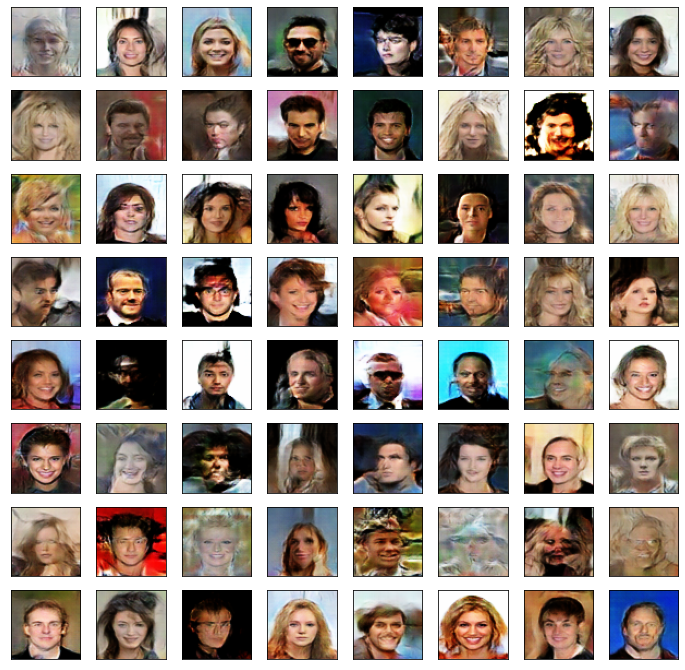

In [ ]:
# Plot the fake images from the last epoch
fig2 = plt.figure(figsize=(12,12))
image_grid(prediction, fig2)

# load model from checkpoint

In [ ]:
os.listdir('/content/drive/MyDrive/wgan_trainrecord1/checkpoints/tensorflow/DCGAN')

['ckpt-1.data-00000-of-00001',
 'ckpt-1.index',
 'ckpt-2.data-00000-of-00001',
 'ckpt-2.index',
 'ckpt-3.data-00000-of-00001',
 'ckpt-3.index',
 'checkpoint']

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/wgan_trainrecord1/checkpoints/tensorflow/DCGAN'
latest = tf.train.latest_checkpoint(checkpoint_dir)
latest

'/content/drive/MyDrive/wgan_trainrecord1/checkpoints/tensorflow/DCGAN/ckpt-3'

In [ ]:
print(len(latest))
ckpt.restore(tf.train.latest_checkpoint(checkpoint_dir))


76


# test

In [ ]:
test_noise = tf.random.normal([64, NOISE_DIM])
prediction = generator.predict(test_noise)

2/2 [==============================] - 8s 12ms/step


In [ ]:
print(prediction,prediction.shape)

In [ ]:
def image_grid(images, fig):
    """Return a 5x5 grid of the MNIST images as a matplotlib figure."""
    # Create a figure to contain the plot.
    for i in range(64):
        # Start next subplot.
        axs = fig.add_subplot(8, 8, i + 1)
        axs.set_xticks([])
        axs.set_yticks([])
        axs.imshow(np.clip(images[i] * 0.5 + 0.5, 0, 1))

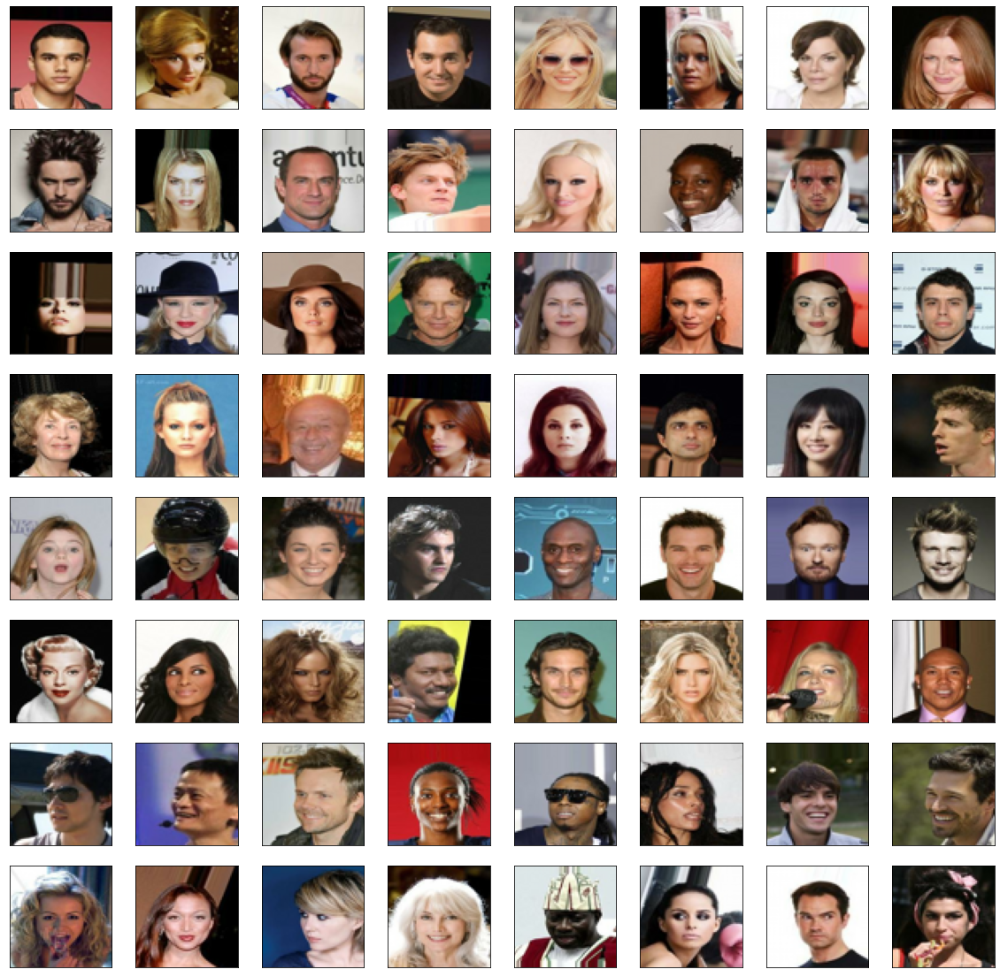

In [ ]:
# Plot the real images for dataset
fig1 = plt.figure(figsize=(20,20))
image_grid(sample_img.numpy()[:64], fig1)
plt.show()

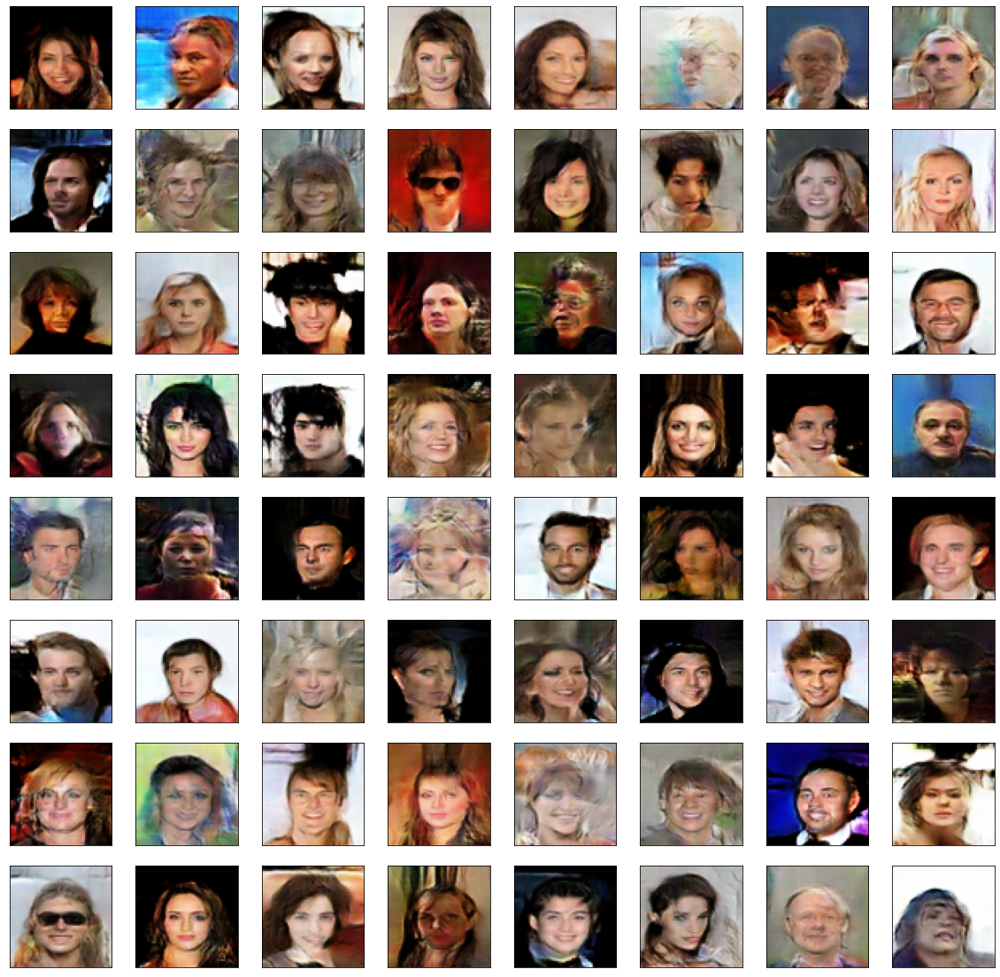

In [ ]:
# Plot the fake images from the last epoch
fig2 = plt.figure(figsize=(20,20))
image_grid(prediction, fig2)

# tensorboard

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
%cd /content/drive/MyDrive/wgan_trainrecord1/logs

/content/drive/MyDrive/wgan_trainrecord1/logs


In [ ]:
%tensorboard --logdir /content/drive/MyDrive/wgan_trainrecord1/logs

Reusing TensorBoard on port 6008 (pid 437), started 0:03:12 ago. (Use '!kill 437' to kill it.)

<IPython.core.display.Javascript object>

# IS

In [ ]:
# calculate inception score for cifar-10 in Keras
from math import floor
from numpy import ones
from numpy import expand_dims
from numpy import log
from numpy import mean
from numpy import std
from numpy import exp
from numpy.random import shuffle
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras.datasets import cifar10
from skimage.transform import resize
from numpy import asarray

# scale an array of images to a new size
def scale_images(images, new_shape):
	images_list = list()
	for image in images:
		# resize with nearest neighbor interpolation
		new_image = resize(image, new_shape, 0)
		# store
		images_list.append(new_image)
	return asarray(images_list)

# assumes images have any shape and pixels in [0,255]
def calculate_inception_score(images, n_split=10, eps=1E-16):
	# load inception v3 model
	model = InceptionV3()
	# enumerate splits of images/predictions
	scores = list()
	n_part = floor(images.shape[0] / n_split)
	for i in range(n_split):
		# retrieve images
		ix_start, ix_end = i * n_part, (i+1) * n_part
		subset = images[ix_start:ix_end]
		# convert from uint8 to float32
		# subset = subset.astype('float32')
		# scale images to the required size
		subset = scale_images(subset, (299,299,3))
		# pre-process images, scale to [-1,1]
		subset = preprocess_input(subset)
		# predict p(y|x)
		p_yx = model.predict(subset)
		# calculate p(y)
		p_y = expand_dims(p_yx.mean(axis=0), 0)
		# calculate KL divergence using log probabilities
		kl_d = p_yx * (log(p_yx + eps) - log(p_y + eps))
		# sum over classes
		sum_kl_d = kl_d.sum(axis=1)
		# average over images
		avg_kl_d = mean(sum_kl_d)
		# undo the log
		is_score = exp(avg_kl_d)
		# store
		scores.append(is_score)
	# average across images
	is_avg, is_std = mean(scores), std(scores)
	return is_avg, is_std

# # load cifar10 images
# (images, _), (_, _) = cifar10.load_data()
# # shuffle images
# shuffle(images)
# print('loaded', images.shape,images)
# # calculate inception score
# is_avg, is_std = calculate_inception_score(images)
# print('score', is_avg, is_std)



The IS of generated images

In [ ]:
test_noise1 = tf.random.normal([5000, NOISE_DIM])
prediction1 = generator.predict(test_noise1)
print(prediction1.shape)
# calculate inception score
is_avg1, is_std1 = calculate_inception_score(prediction1)
print('score', is_avg1, is_std1)

157/157 [==============================] - 2s 10ms/step
(5000, 64, 64, 3)
16/16 [==============================] - 2s 120ms/step
score 1.057235 0.008250325


The IS of real images

In [ ]:
fid_sample0 = list_ds.map(preprocess_image).shuffle(1000).batch(5000)
im0 = next(iter(fid_sample0))
print(im0,im0.shape)
is_avg2, is_std2 = calculate_inception_score(im0)
print('score of real data', is_avg2, is_std2)

tf.Tensor(
[[[[ 0.9999999   0.9999999   0.9999999 ]
   [ 0.9999999   0.9999999   0.9999999 ]
   [ 0.9999999   0.9999999   0.9999999 ]
   ...
   [ 1.          1.          1.        ]
   [ 0.99999976  0.99999976  0.99999976]
   [ 1.          1.          1.        ]]

  [[ 1.0000001   1.0000001   1.0000001 ]
   [ 0.9999999   0.9999999   0.9999999 ]
   [ 1.0000001   1.0000001   1.0000001 ]
   ...
   [ 1.0000002   1.0000002   1.0000002 ]
   [ 1.          1.          1.        ]
   [ 1.          1.          1.        ]]

  [[ 0.99999964  0.99999964  0.99999964]
   [ 0.9999994   0.9999994   0.9999994 ]
   [ 0.99999964  0.99999964  0.99999964]
   ...
   [ 0.9999995   0.9999995   0.9999995 ]
   [ 0.9999995   0.9999995   0.9999995 ]
   [ 0.99999964  0.99999964  0.99999964]]

  ...

  [[ 0.9783501   0.57777566 -0.5181612 ]
   [ 0.93752646  0.57620156 -0.5836195 ]
   [ 0.93179166  0.6123022  -0.59634745]
   ...
   [ 0.8362958   0.43499815 -0.5552972 ]
   [ 0.82268786  0.46870786 -0.5296233 ]
   [ 

# FID

In [ ]:
# example of calculating the frechet inception distance in Keras
import numpy
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy import asarray
from numpy.random import randint
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras.datasets.mnist import load_data
from skimage.transform import resize

# scale an array of images to a new size
def scale_images(images, new_shape):
	images_list = list()
	for image in images:
		# resize with nearest neighbor interpolation
		new_image = resize(image, new_shape, 0)
		# store
		images_list.append(new_image)
	return asarray(images_list)

# calculate frechet inception distance
def calculate_fid(model, images1, images2):
	# calculate activations
	act1 = model.predict(images1)
	act2 = model.predict(images2)
	# calculate mean and covariance statistics
	mu1, sigma1 = act1.mean(axis=0), cov(act1, rowvar=False)
	mu2, sigma2 = act2.mean(axis=0), cov(act2, rowvar=False)
	# calculate sum squared difference between means
	ssdiff = numpy.sum((mu1 - mu2)**2.0)
	# calculate sqrt of product between cov
	covmean = sqrtm(sigma1.dot(sigma2))
	# check and correct imaginary numbers from sqrt
	if iscomplexobj(covmean):
		covmean = covmean.real
	# calculate score
	fid = ssdiff + trace(sigma1 + sigma2 - 2.0 * covmean)
	return fid

# prepare the inception v3 model
model = InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3))
# define two fake collections of images


In [ ]:
fid_sample = list_ds.map(preprocess_image).shuffle(1000).batch(500)
im1 = next(iter(fid_sample))
print(im1,im1.shape)

tf.Tensor(
[[[[-0.894875   -0.9013563  -0.9950361 ]
   [-0.89477193 -0.9012533  -0.9952541 ]
   [-0.8960836  -0.9025649  -0.99422157]
   ...
   [-0.76004237 -0.7835717  -0.91344714]
   [-0.76506317 -0.7885926  -0.90627635]
   [-0.7701433  -0.7936726  -0.9112522 ]]

  [[-0.8233989  -0.8429886  -0.93534946]
   [-0.8389706  -0.85856026 -0.95081913]
   [-0.8563734  -0.87596315 -0.96737516]
   ...
   [-0.7598525  -0.78338194 -0.9132573 ]
   [-0.76507103 -0.78860044 -0.9062842 ]
   [-0.770551   -0.79408044 -0.91166   ]]

  [[-0.7980243  -0.83239615 -0.91761905]
   [-0.79808515 -0.83245695 -0.917688  ]
   [-0.7966018  -0.8309737  -0.91629547]
   ...
   [-0.763369   -0.78689843 -0.9167738 ]
   [-0.7648755  -0.7884049  -0.90608853]
   [-0.76489305 -0.78842247 -0.906002  ]]

  ...

  [[ 0.28504592 -0.50675064 -0.4992619 ]
   [ 0.20457248 -0.5722557  -0.5918198 ]
   [ 0.11401403 -0.6388031  -0.68663675]
   ...
   [-0.5754106  -0.70632386 -0.9764493 ]
   [-0.57985383 -0.71079975 -0.98007125]
   [-

In [ ]:
test_noise2 = tf.random.normal([500, NOISE_DIM])
prediction2 = generator.predict(test_noise2)
print(prediction2.shape)

16/16 [==============================] - 1s 26ms/step
(500, 64, 64, 3)


In [ ]:
# images1 = randint(0, 255, 10*32*32*3)
# images1 = images1.reshape((10,32,32,3))
# images2 = randint(0, 255, 10*32*32*3)
# images2 = images2.reshape((10,32,32,3))
images1 = im1
images2 = prediction2
print('Prepared', images1.shape, images2.shape)
# convert integer to floating point values
# images1 = images1.astype('float32')
# images2 = images2.astype('float32')
# resize images
images1 = scale_images(images1, (299,299,3))
images2 = scale_images(images2, (299,299,3))
print('Scaled', images1.shape, images2.shape)
# pre-process images
images1 = preprocess_input(images1)
images2 = preprocess_input(images2)
# fid between images1 and images1
fid = calculate_fid(model, images1, images1)
print('FID (same): %.3f' % fid)
# fid between images1 and images2
fid = calculate_fid(model, images1, images2)
print('FID (different): %.3f' % fid)

Prepared (500, 64, 64, 3) (500, 64, 64, 3)
Scaled (500, 299, 299, 3) (500, 299, 299, 3)
16/16 [==============================] - 2s 118ms/step
FID (same): -0.000
16/16 [==============================] - 2s 113ms/step
FID (different): 1.716


# download file

In [ ]:
import os, tarfile
 
import os
from google.colab import files
# output_filename
source_dir = "/content/checkpoints"
def make_targz_one_by_one(output_filename, source_dir):
  tar = tarfile.open(output_filename,"w")
  for root,dir_name,files_list in os.walk(source_dir):
    for file in files_list:
      pathfile = os.path.join(root, file)
      tar.add(pathfile)
  tar.close()
 
  files.download(output_filename)
 
 
make_targz_one_by_one('check', '/content/checkpoints')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
files.download("/content/checkpoints")

In [ ]:
import os, tarfile
 
import os
from google.colab import files
# output_filename
source_dir = "/content/checkpoints"
def make_targz_one_by_one(output_filename, source_dir):
  tar = tarfile.open(output_filename,"w")
  for root,dir_name,files_list in os.walk(source_dir):
    for file in files_list:
      pathfile = os.path.join(root, file)
      tar.add(pathfile)
  tar.close()
 
  files.download(output_filename)
 
 
make_targz_one_by_one('check1', '/content/checkpoints')


In [ ]:
%load_ext tensorboard



In [ ]:
%tensorboard — '/content/logs/tensorflow/DCGAN/train_data' 

ERROR: Failed to launch TensorBoard (exited with 2).
Contents of stderr:
usage: tensorboard [-h] [--helpfull] {serve,dev} ...
tensorboard: error: invalid choice: '—' (choose from 'serve', 'dev')